In [8]:
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from models import LSTMStressPredictor
import h5py

In [9]:
ndim = 6

ckpt = {
    "a": "ckpts/task_a_lstm_model_pp.pth",
    "b": "ckpts/task_b_lstm_model.pth", 
    "c": "ckpts/task_c_lstm_model.pth", 
}

model_a = LSTMStressPredictor(input_dim=ndim, output_dim=ndim, hidden_dim=1000, num_layers=2, dropout=0.1)
model_a.load_state_dict(torch.load(ckpt["a"], map_location=torch.device('cpu')))

#model_b = LSTMStressPredictor(input_dim=ndim, output_dim=ndim, hidden_dim=1800, num_layers=1, dropout=0.)
model_b = LSTMStressPredictor(input_dim=ndim, output_dim=ndim, hidden_dim=1800, num_layers=1, dropout=0.)
model_b.load_state_dict(torch.load(ckpt["b"], map_location=torch.device('cpu')))

model_c = LSTMStressPredictor(input_dim=1, output_dim=1, hidden_dim=100, num_layers=2, dropout=0.1, bidirectional=True)
model_c.load_state_dict(torch.load(ckpt["c"], map_location=torch.device('cpu')))


/tmp/ipykernel_392217/1945703819.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_a.load_state_dict(torch.load(ckpt["a"], map_location=torch.device('cpu')))
/tmp/i

<All keys matched successfully>

In [10]:
print(f"""
Model A: {round(sum([p.numel() for p in model_a.parameters()])/1E6,1)} M parameters
Model B: {round(sum([p.numel() for p in model_b.parameters()])/1E6,1)} M parameters
Model C: {round(sum([p.numel() for p in model_c.parameters()])/1E6,3)} M parameters
""")


Model A: 13.0 M parameters
Model B: 16.3 M parameters
Model C: 0.364 M parameters



In [11]:
# This reads the matlab data from the .mat file provided
class MatRead(object):
    def __init__(self, file_path):
        super(MatRead).__init__()

        self.file_path = file_path
        self.data = h5py.File(self.file_path)

    def get_strain(self):
        strain = np.array(self.data['strain']).transpose(2,0,1)
        return torch.tensor(strain, dtype=torch.float32)

    def get_stress(self):
        stress = np.array(self.data['stress']).transpose(2,0,1)
        return torch.tensor(stress, dtype=torch.float32)

######################### Data processing #############################
# Read data from .mat file
path = 'Data/Material_A.mat' #Define your data path here
data_reader = MatRead(path)
strain_a = data_reader.get_strain()
stress_a = data_reader.get_stress()
path = 'Data/Material_B.mat' #Define your data path here
data_reader = MatRead(path)
strain_b = data_reader.get_strain()
stress_b = data_reader.get_stress()
path = 'Data/Material_C.mat' #Define your data path here
data_reader = MatRead(path)
strain_c = data_reader.get_strain()
stress_c = data_reader.get_stress()

In [12]:
class DataStandardizer(object):
    """
    Input shape: (dataset_size, time_steps, 6) where 6 is the number of strain/ stress components (exx, eyy, ezz, exy, eyz, ezx).
    Normalize the strain/stress data to have range 0,1.
    """
    def __init__(self, data, epsilon=1e-6):
        self.epsilon = epsilon
        # Compute mean and std across dataset_size and time_steps
        self.mean = torch.mean(data, dim=(0,1))
        self.std = torch.std(data, dim=(0,1))#+self.epsilon
    @torch.no_grad()
    def normalize(self, data):
        return (data - self.mean) / (self.std+self.epsilon)

    def denormalize(self, data):
        return data * self.std + self.mean

normalizers = [
    (DataStandardizer(strain_a),DataStandardizer(stress_a)),
    (DataStandardizer(strain_b),DataStandardizer(stress_b)),
    (DataStandardizer(strain_c),DataStandardizer(stress_c)),
]


Ramp Response

torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])


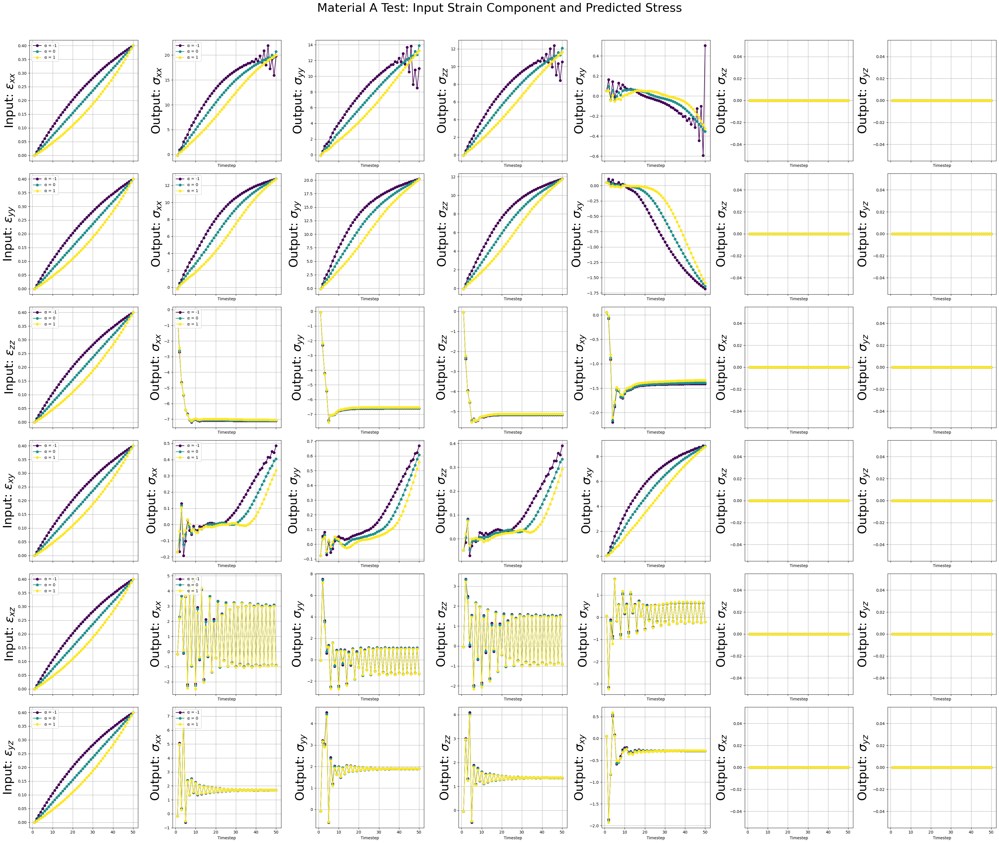

torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])


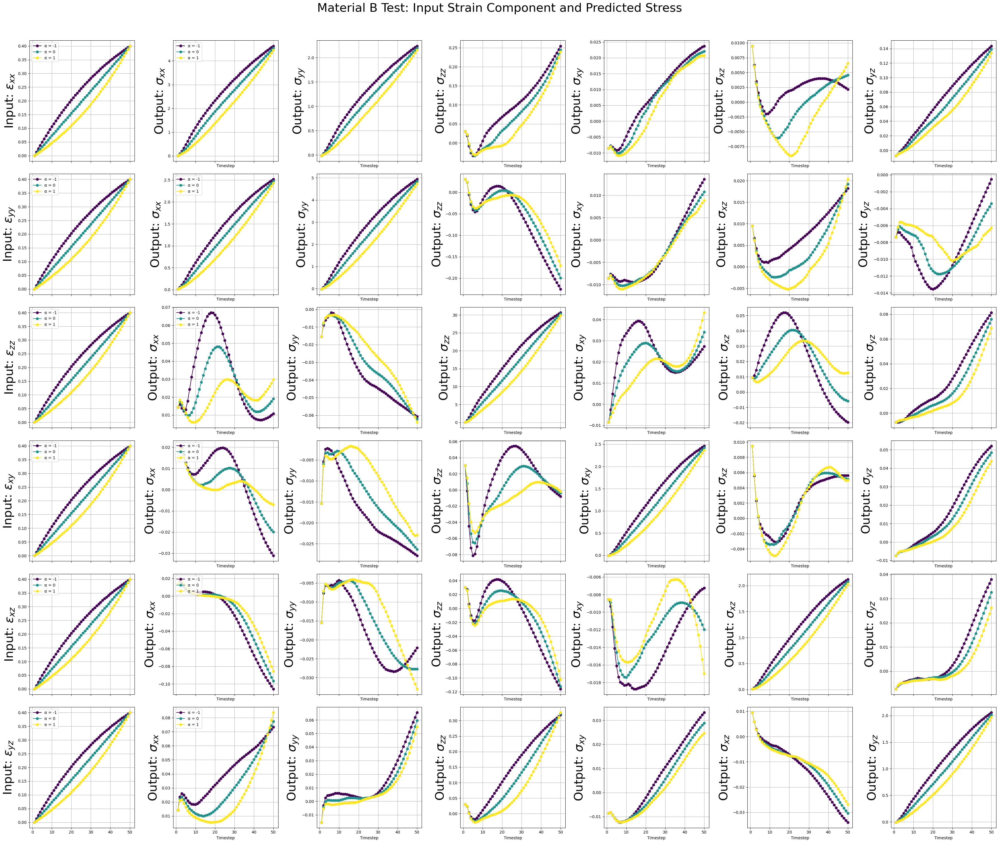

torch.Size([50, 1])
torch.Size([50, 1])
torch.Size([50, 1])


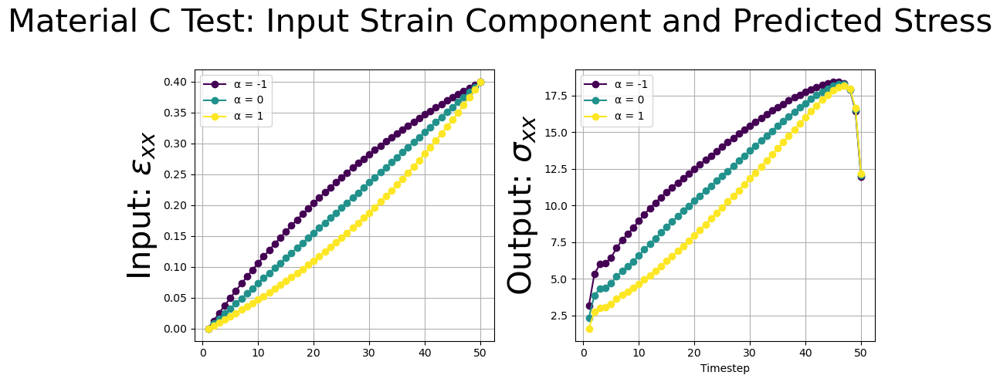

In [25]:
# Settings
materials =["A", "B", "C"]
max_strain = 0.4     # Maximum strain value
T = 50               # Number of timesteps per sequence
bsz = 1              # Batch size
ndim = 6             # Number of strain components per timestep
alphas = [-1, 0, 1]  # Controls nonlinearity

# Assume your three trained models are model_a, model_b, model_c.
# They should be loaded and moved to the device.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
models = [model_a, model_b, model_c]
for net in models:
    net.to(device)
    net.eval()

# Create a time vector from 0 to 1 with T steps.
t = torch.linspace(0, 1, steps=T)

# For each model, generate a figure with 7 subplots:
#   - Panel 1: Input strain (for one representative channel, say channel 0) for each alpha.
#   - Panels 2-7: Predicted stress for each of the 6 components (channels 0-5) for each alpha.
# Use a consistent color for each alpha across all panels.
colors = plt.cm.viridis(np.linspace(0, 1, len(alphas)))
steps_array = np.arange(1, T + 1)
# Create a figure with 7 rows (first row: strain input; next 6 rows: each stress component)

# Loop over models
for m_idx, net in enumerate(models):
    strain_standardizer, stress_standardizer = normalizers[m_idx]
    ndim = 6 if m_idx<2 else 1
    num_cols = 7 if m_idx<2 else 2
    figsize = (35,30) if m_idx<2 else (10, 5)
    fig, axes = plt.subplots(ndim, num_cols, figsize=figsize, sharex=True)
    
    # Dictionaries to store strain inputs and sigma predictions for all alphas
    strain_inputs = [{} for _ in range(ndim)]  # Each value: tensor of shape (bsz, T, ndim)
    sigma_predictions = [{} for _ in range(ndim)]  # Each value: tensor of shape (bsz, T, ndim)
    
    # Generate test inputs for each alpha
    for alpha in alphas:
        if alpha == 0:
            # Linear ramp
            strain_1d = t * max_strain
        else:
            # Nonlinear progression: using an exponential mapping
            alpha_val = torch.tensor(alpha, dtype=torch.float)
            strain_1d = (torch.exp(alpha_val * t) - 1) / (torch.exp(alpha_val) - 1) * max_strain
        # Create a tensor for a loading path: shape (T, 6) by repeating the 1D strain for all 6 components.
        
        for i in range(ndim):
            strain_tensor = torch.zeros((T, ndim))  # shape: (T, ndim)
            # Add a batch dimension to have shape (bsz, T, ndim)
            strain_tensor[:, i] = strain_1d  
            strain_inputs[i][alpha] = strain_tensor

            # Pass through the network to get predicted stress (σ = net(ε))
            with torch.no_grad():
                strain_tensor_enc = strain_standardizer.normalize(strain_tensor)
                sigma_pred_enc = net(strain_tensor_enc.to(device))
                sigma_pred = stress_standardizer.denormalize(sigma_pred_enc)
            sigma_predictions[i][alpha] = sigma_pred.cpu()
    
            fig.suptitle(f"Material {materials[m_idx]} Test: Input Strain Component and Predicted Stress", fontsize=30)

    # Panel 1: Plot the strain history for a representative strain component (channel 0)
    component_features = [r"$\varepsilon_{xx}$", r"$\varepsilon_{yy}$", r"$\varepsilon_{zz}$", r"$\varepsilon_{xy}$", r"$\varepsilon_{xz}$", r"$\varepsilon_{yz}$"]
    for j, alpha in enumerate(alphas):
        for i in range(ndim):
            strain_np = strain_inputs[i][alpha][ :, i].numpy()
            try:
                ax = axes[i][0]
            except:
                ax = axes[0]
            ax.plot(steps_array, strain_np, marker='o', color=colors[j], label=f"α = {alpha}")
            ax.set_ylabel(f"Input: {component_features[i]}", fontsize=30)
            #ax.set_title(f" Strain: {component_features[i]}", fontsize=25)
            ax.grid(True)
            ax.legend(loc="upper left")

    # Panels 2-7: Plot predicted stress for each of the 6 components.
    component_labels = [r"$\sigma_{xx}$", r"$\sigma_{yy}$", r"$\sigma_{zz}$", r"$\sigma_{xy}$", r"$\sigma_{xz}$", r"$\sigma_{yz}$"]
    
    for comp in range(ndim):
        for j, alpha in enumerate(alphas):
            for i in range(ndim):
                print(sigma_predictions[i][alpha].shape)
                sigma_np = sigma_predictions[i][alpha][:, comp].numpy()
                try:
                    ax = axes[i][comp+1]
                except:
                    ax = axes[comp+1]
                ax.plot(steps_array, sigma_np, marker='o', color=colors[j], label=f"α = {alpha}" if comp==0 else None)
                ax.set_ylabel(f"Output: {component_labels[comp]}", fontsize=30)
                #ax.set_title(f"Stress: {component_labels[comp]}",figsize=25)
                ax.grid(True)
                if comp == 0:
                    ax.legend(loc="upper left")

                ax.set_xlabel("Timestep")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(f"figures/ramp_response_{m_idx}.png")
    plt.show()


Step Response

torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])


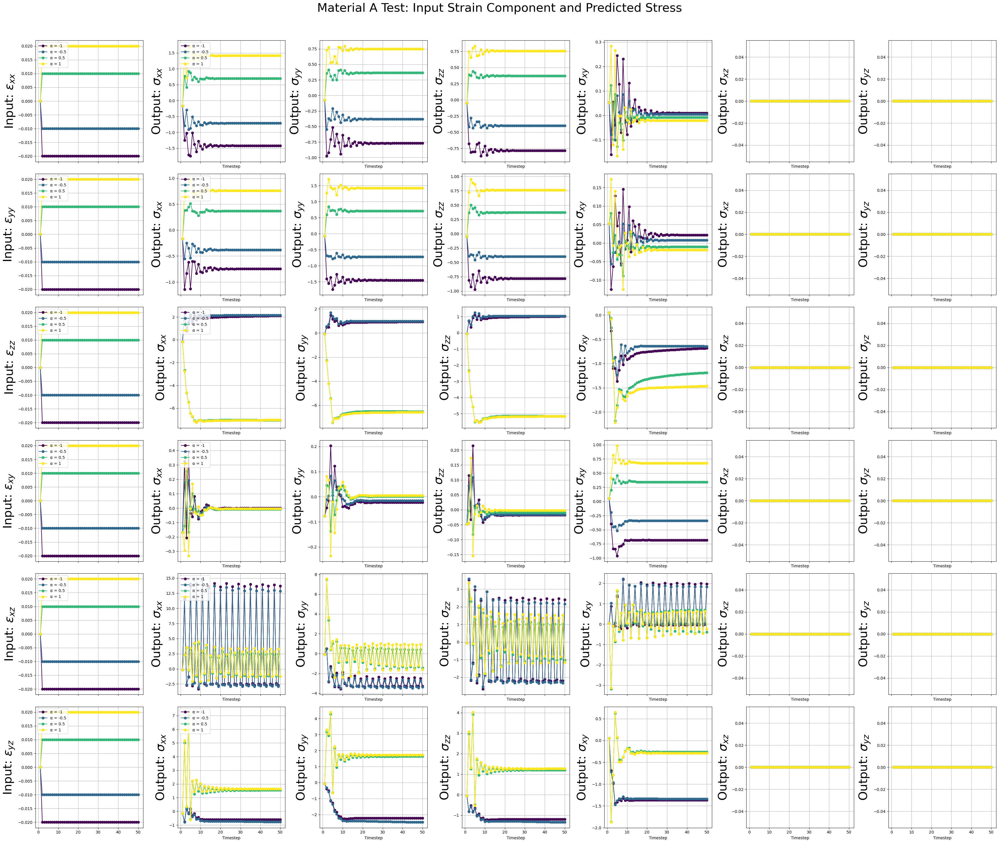

torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])


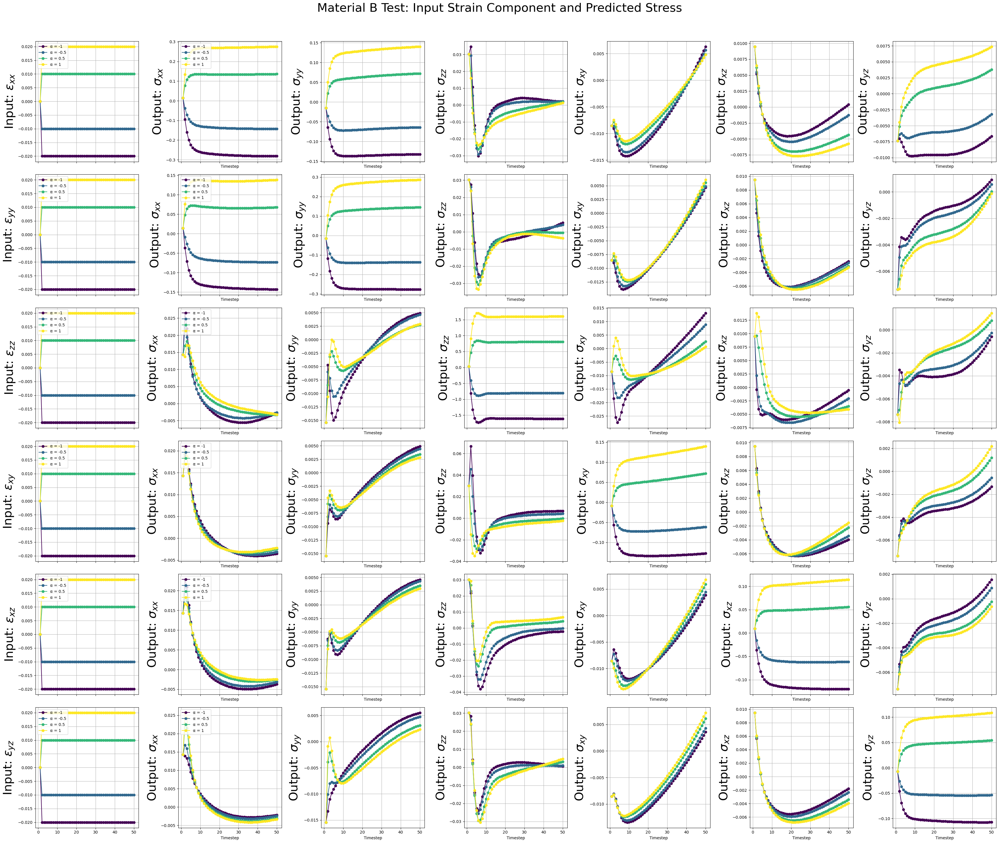

torch.Size([50, 1])
torch.Size([50, 1])
torch.Size([50, 1])
torch.Size([50, 1])


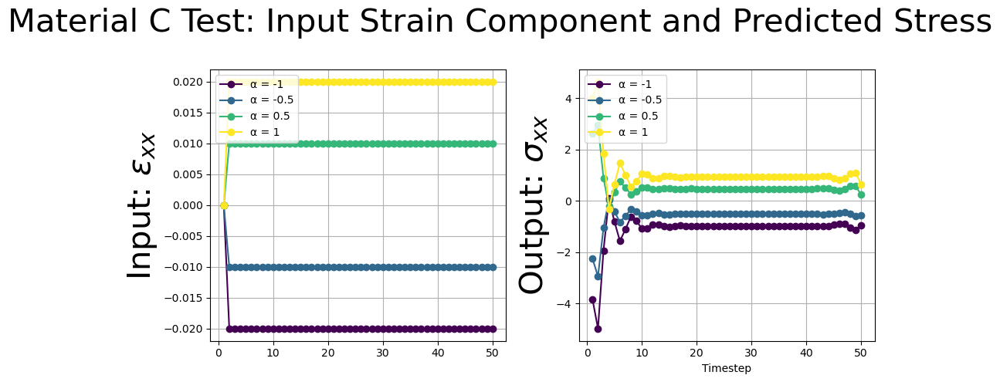

In [16]:
# Settings
materials =["A", "B", "C"]
max_strain = 0.02     # Maximum strain value
T = 50               # Number of timesteps per sequence
bsz = 1              # Batch size
ndim = 6             # Number of strain components per timestep
alphas = [-1, -0.5, 0.5, 1]  # Controls ramp magnification

# Assume your three trained models are model_a, model_b, model_c.
# They should be loaded and moved to the device.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
models = [model_a, model_b, model_c]
for net in models:
    net.to(device)
    net.eval()

# Create a time vector from 0 to 1 with T steps.
t = torch.linspace(0, 1, steps=T)

# For each model, generate a figure with 7 subplots:
#   - Panel 1: Input strain (for one representative channel, say channel 0) for each alpha.
#   - Panels 2-7: Predicted stress for each of the 6 components (channels 0-5) for each alpha.
# Use a consistent color for each alpha across all panels.
colors = plt.cm.viridis(np.linspace(0, 1, len(alphas)))
steps_array = np.arange(1, T + 1)
# Create a figure with 7 rows (first row: strain input; next 6 rows: each stress component)

# Loop over models
for m_idx, net in enumerate(models):
    strain_standardizer, stress_standardizer = normalizers[m_idx]
    ndim = 6 if m_idx<2 else 1
    num_cols = 7 if m_idx<2 else 2
    figsize = (35,30) if m_idx<2 else (10, 5)
    fig, axes = plt.subplots(ndim, num_cols, figsize=figsize, sharex=True)
    
    # Dictionaries to store strain inputs and sigma predictions for all alphas
    strain_inputs = [{} for _ in range(ndim)]  # Each value: tensor of shape (bsz, T, ndim)
    sigma_predictions = [{} for _ in range(ndim)]  # Each value: tensor of shape (bsz, T, ndim)
    
    # Generate test inputs for each alpha
    for alpha in alphas:
        strain_1d = alpha * max_strain * (t > 0.01).float()
        # Create a tensor for a loading path: shape (T, 6) by repeating the 1D strain for all 6 components.
        
        for i in range(ndim):
            strain_tensor = torch.zeros((T, ndim))  # shape: (T, ndim)
            # Add a batch dimension to have shape (bsz, T, ndim)
            strain_tensor[:, i] = strain_1d  
            strain_inputs[i][alpha] = strain_tensor

            # Pass through the network to get predicted stress (σ = net(ε))
            with torch.no_grad():
                strain_tensor_enc = strain_standardizer.normalize(strain_tensor)
                sigma_pred_enc = net(strain_tensor_enc.to(device))
                sigma_pred = stress_standardizer.denormalize(sigma_pred_enc)
            sigma_predictions[i][alpha] = sigma_pred.cpu()
    
            fig.suptitle(f"Material {materials[m_idx]} Test: Input Strain Component and Predicted Stress", fontsize=30)

    # Panel 1: Plot the strain history for a representative strain component (channel 0)
    component_features = [r"$\varepsilon_{xx}$", r"$\varepsilon_{yy}$", r"$\varepsilon_{zz}$", r"$\varepsilon_{xy}$", r"$\varepsilon_{xz}$", r"$\varepsilon_{yz}$"]
    for j, alpha in enumerate(alphas):
        for i in range(ndim):
            strain_np = strain_inputs[i][alpha][ :, i].numpy()
            try:
                ax = axes[i][0]
            except:
                ax = axes[0]
            ax.plot(steps_array, strain_np, marker='o', color=colors[j], label=f"α = {alpha}")
            ax.set_ylabel(f"Input: {component_features[i]}", fontsize=30)
            #ax.set_title(f" Strain: {component_features[i]}", fontsize=25)
            ax.grid(True)
            ax.legend(loc="upper left")

    # Panels 2-7: Plot predicted stress for each of the 6 components.
    component_labels = [r"$\sigma_{xx}$", r"$\sigma_{yy}$", r"$\sigma_{zz}$", r"$\sigma_{xy}$", r"$\sigma_{xz}$", r"$\sigma_{yz}$"]
    
    for comp in range(ndim):
        for j, alpha in enumerate(alphas):
            for i in range(ndim):
                print(sigma_predictions[i][alpha].shape)
                sigma_np = sigma_predictions[i][alpha][:, comp].numpy()
                try:
                    ax = axes[i][comp+1]
                except:
                    ax = axes[comp+1]
                ax.plot(steps_array, sigma_np, marker='o', color=colors[j], label=f"α = {alpha}" if comp==0 else None)
                ax.set_ylabel(f"Output: {component_labels[comp]}", fontsize=30)
                #ax.set_title(f"Stress: {component_labels[comp]}",figsize=25)
                ax.grid(True)
                if comp == 0:
                    ax.legend(loc="upper left")

                ax.set_xlabel("Timestep")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(f"figures/step_response_{m_idx}.png")
    plt.show()

Sinusoidal Response

torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])


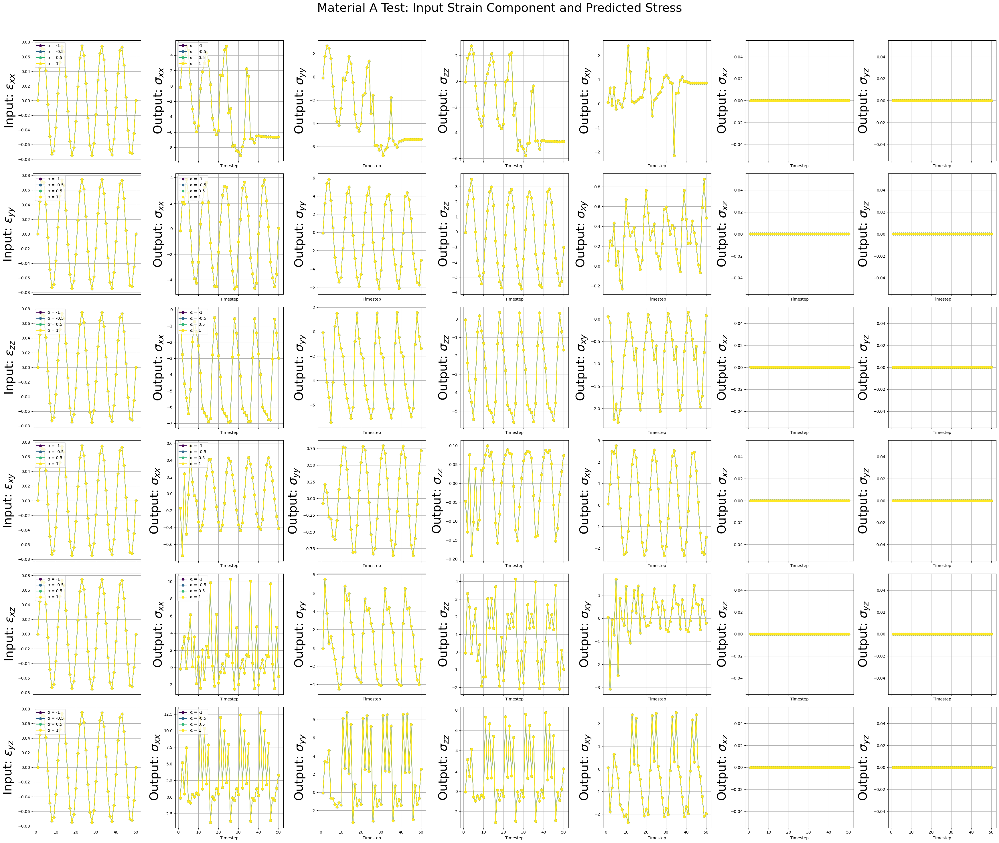

torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])
torch.Size([50, 6])


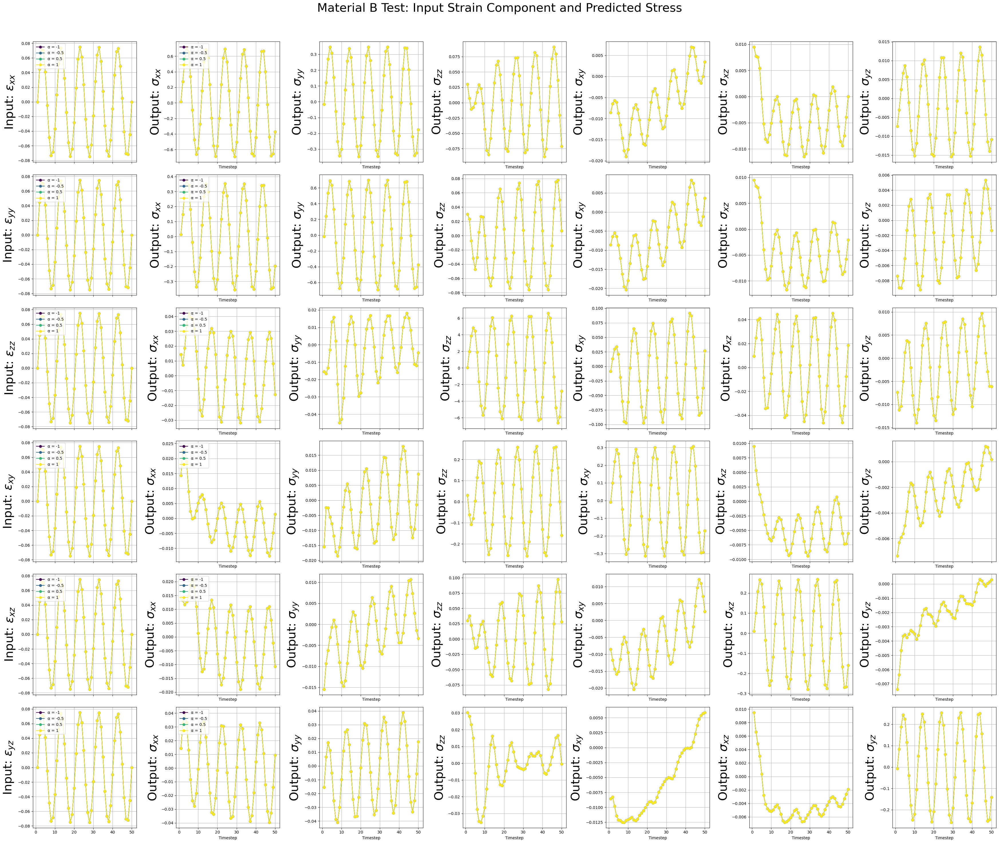

torch.Size([50, 1])
torch.Size([50, 1])
torch.Size([50, 1])
torch.Size([50, 1])


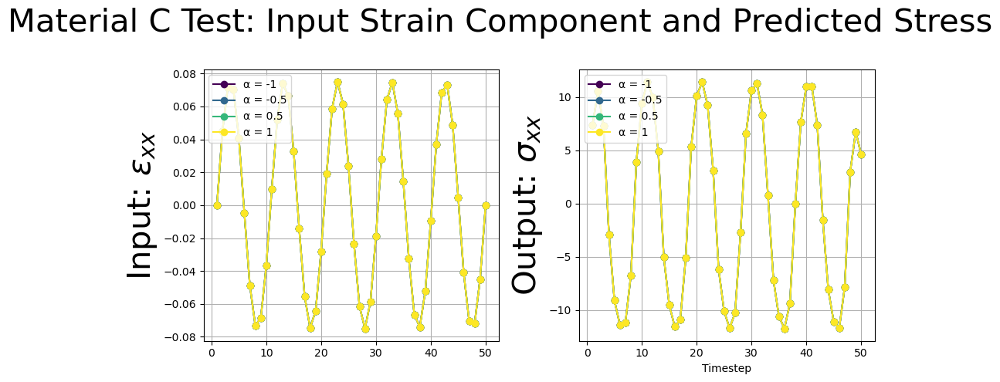

In [21]:
# Settings
materials =["A", "B", "C"]
max_strain = 0.075     # Maximum strain value
num_cycles = 5       # Number of cycles in the sinusoidal strain
omega_T = 2 * np.pi * num_cycles   # Frequency of the sinusoidal strain
T = 50               # Number of timesteps per sequence
bsz = 1              # Batch size
ndim = 6             # Number of strain components per timestep
alphas = [-1, -0.5, 0.5, 1]  # Controls ramp magnification

# Assume your three trained models are model_a, model_b, model_c.
# They should be loaded and moved to the device.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
models = [model_a, model_b, model_c]
for net in models:
    net.to(device)
    net.eval()

# Create a time vector from 0 to 1 with T steps.
t = torch.linspace(0, 1, steps=T)

# For each model, generate a figure with 7 subplots:
#   - Panel 1: Input strain (for one representative channel, say channel 0) for each alpha.
#   - Panels 2-7: Predicted stress for each of the 6 components (channels 0-5) for each alpha.
# Use a consistent color for each alpha across all panels.
colors = plt.cm.viridis(np.linspace(0, 1, len(alphas)))
steps_array = np.arange(1, T + 1)
# Create a figure with 7 rows (first row: strain input; next 6 rows: each stress component)

# Loop over models
for m_idx, net in enumerate(models):
    strain_standardizer, stress_standardizer = normalizers[m_idx]
    ndim = 6 if m_idx<2 else 1
    num_cols = 7 if m_idx<2 else 2
    figsize = (35,30) if m_idx<2 else (10, 5)
    fig, axes = plt.subplots(ndim, num_cols, figsize=figsize, sharex=True)
    
    # Dictionaries to store strain inputs and sigma predictions for all alphas
    strain_inputs = [{} for _ in range(ndim)]  # Each value: tensor of shape (bsz, T, ndim)
    sigma_predictions = [{} for _ in range(ndim)]  # Each value: tensor of shape (bsz, T, ndim)
    
    # Generate test inputs for each alpha
    for alpha in alphas:
        strain_1d =  max_strain * torch.sin(omega_T * t)
        # Create a tensor for a loading path: shape (T, 6) by repeating the 1D strain for all 6 components.
        
        for i in range(ndim):
            strain_tensor = torch.zeros((T, ndim))  # shape: (T, ndim)
            # Add a batch dimension to have shape (bsz, T, ndim)
            strain_tensor[:, i] = strain_1d  
            strain_inputs[i][alpha] = strain_tensor

            # Pass through the network to get predicted stress (σ = net(ε))
            with torch.no_grad():
                strain_tensor_enc = strain_standardizer.normalize(strain_tensor)
                sigma_pred_enc = net(strain_tensor_enc.to(device))
                sigma_pred = stress_standardizer.denormalize(sigma_pred_enc)
            sigma_predictions[i][alpha] = sigma_pred.cpu()
    
            fig.suptitle(f"Material {materials[m_idx]} Test: Input Strain Component and Predicted Stress", fontsize=30)

    # Panel 1: Plot the strain history for a representative strain component (channel 0)
    component_features = [r"$\varepsilon_{xx}$", r"$\varepsilon_{yy}$", r"$\varepsilon_{zz}$", r"$\varepsilon_{xy}$", r"$\varepsilon_{xz}$", r"$\varepsilon_{yz}$"]
    for j, alpha in enumerate(alphas):
        for i in range(ndim):
            strain_np = strain_inputs[i][alpha][ :, i].numpy()
            try:
                ax = axes[i][0]
            except:
                ax = axes[0]
            ax.plot(steps_array, strain_np, marker='o', color=colors[j], label=f"α = {alpha}")
            ax.set_ylabel(f"Input: {component_features[i]}", fontsize=30)
            #ax.set_title(f" Strain: {component_features[i]}", fontsize=25)
            ax.grid(True)
            ax.legend(loc="upper left")

    # Panels 2-7: Plot predicted stress for each of the 6 components.
    component_labels = [r"$\sigma_{xx}$", r"$\sigma_{yy}$", r"$\sigma_{zz}$", r"$\sigma_{xy}$", r"$\sigma_{xz}$", r"$\sigma_{yz}$"]
    
    for comp in range(ndim):
        for j, alpha in enumerate(alphas):
            for i in range(ndim):
                print(sigma_predictions[i][alpha].shape)
                sigma_np = sigma_predictions[i][alpha][:, comp].numpy()
                try:
                    ax = axes[i][comp+1]
                except:
                    ax = axes[comp+1]
                ax.plot(steps_array, sigma_np, marker='o', color=colors[j], label=f"α = {alpha}" if comp==0 else None)
                ax.set_ylabel(f"Output: {component_labels[comp]}", fontsize=30)
                #ax.set_title(f"Stress: {component_labels[comp]}",figsize=25)
                ax.grid(True)
                if comp == 0:
                    ax.legend(loc="upper left")

                ax.set_xlabel("Timestep")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(f"figures/harm_response_{m_idx}.png")
    plt.show()